<a href="https://colab.research.google.com/github/Guillin/Boat-types-recognition/blob/main/boat_types_recognition_resnet50_transfer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [17]:
!sudo apt install tree  

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following NEW packages will be installed:
  tree
0 upgraded, 1 newly installed, 0 to remove and 24 not upgraded.
Need to get 43.0 kB of archives.
After this operation, 115 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu focal/universe amd64 tree amd64 1.8.0-1 [43.0 kB]
Fetched 43.0 kB in 0s (312 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 76, <> line 1.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletype
dpkg-preconfigure: unable to re-open stdin: 
Selecting previously unselected package tree.
(Reading database ... 122531 files and directories currently installe

# 1.0 Intro

In this tutorial, we’ll create an end to end pipeline for image multiclass classification using Pytorch. We will use the [Boat Dataset](https://www.kaggle.com/clorichel/boat-types-recognition/version/1) from Kaggle to classify images of 5 types of boats. We will go over the steps of dataset preparation, data augmentation and then the steps to train a convolutional neural network using transfer learning. 

As you might know, very few people train an entire Convolutional Network from scratch, because it is required a big dataset and also, it has a hight computational cost. Instead, what you can do is get a pretrain ConvNet model who was trained on a very large dataset (e.g. ImageNet, which contains 1.2 million images with 1000 categories), and then use the ConvNet either as an initialization or a fixed feature extractor for the task of interest. This technique is called `Transfer Learning`.


There are two `Transfer Learning` approachs:


- **Finetuning** the ConvNet: Instead of random initialization. We initialize the network with a pretrained network, like the one that is trained on imagenet 1000 dataset. The rest of the training looks as usual.
- ConvNet as **fixed feature extractor**: Here, we will freeze the weights for all of the network except that of the final fully connected layer. This last fully connected layer is replaced with a new one with random weights and only this layer is trained. 

In this tutorial we'll try both and compare their results.

# 2.0 Load Libraries

Here we load the main libraries we are going to work with.

In [1]:
%matplotlib inline

In [2]:
import numpy as np
import pandas as pd
from glob import glob
import time
import os
import copy
import shutil
import matplotlib.pyplot as plt
import seaborn as sns 
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from tqdm.notebook import tqdm
import torch
from torch import nn
from torchvision import datasets
from torch.utils.data import DataLoader
from torchvision import models
from torch import optim
from torchvision import transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import Dataset


from PIL import Image
import warnings
warnings.filterwarnings("ignore")

# 3.0 Download and process datasets

Following these steps, it will download the images and make the necessary folders that will allow us to go through the tutorial. 

Note: You might need a kaggle's account and download the key.

In [3]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"guillermolissa","key":"230750165109c4855691f52372408159"}'}

In [4]:
! pip install -q kaggle
! mkdir ~/.kaggle
! mv kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

In [5]:
!kaggle datasets download -d clorichel/boat-types-recognition

 99% 838M/842M [00:08<00:00, 109MB/s] 
100% 842M/842M [00:08<00:00, 100MB/s]


In [6]:
! mkdir data
! unzip -q boat-types-recognition.zip -d data/

In [27]:
# fixing something wrong with the folders.
! rm -R data/buoy/ & rm -R data/cruise\ ship & rm -R data/ferry\ boat & rm -R data/freight\ boat & rm -R data/gondola/ & rm -R data/inflatable\ boat & rm -R data/kayak/ & rm -R data/paper\ boat & rm -R data/sailboat/

In [7]:
! mkdir models


# 4.0 Exploring Dataset and Visualize images

Firstly we have to explore our dataset and get some insight about the problem we want to solve.






In [8]:
PATH = r"data/boats"
MODEL_FILE_PATH = r'models/'

In [9]:
categories = glob(PATH+"/*")
for cat in categories:
    os.replace(cat, cat.replace(" ", "_"))

categories = glob(PATH+"/*")
categories

['data/boats/freight_boat',
 'data/boats/kayak',
 'data/boats/paper_boat',
 'data/boats/cruise_ship',
 'data/boats/inflatable_boat',
 'data/boats/sailboat',
 'data/boats/ferry_boat',
 'data/boats/gondola',
 'data/boats/buoy']

In [10]:
df_boat = pd.DataFrame([], columns=["category", "filepath"])


for c in categories:
    
    df_tmp = pd.DataFrame({"category": c.split('/')[-1], "filepath": glob(c+"/*")})
    df_boat = pd.concat([df_boat, df_tmp])

df_boat.head()

,category,filepath
0,freight_boat,data/boats/freight_boat/port-loading-dischargi...
1,freight_boat,data/boats/freight_boat/life-beauty-scene-tran...
2,freight_boat,data/boats/freight_boat/freight-liner-ship-lin...
3,freight_boat,data/boats/freight_boat/sluice-system-lock-314...
4,freight_boat,data/boats/freight_boat/crane-swimming-boat-ha...


As you can see from the graph bellow, this dataset contains 1,462 pictures of boats of different types: sailboats, kayaks, gondolas, cruise ships, ferry boats, buoys, paper boats, freight boats and inflatable boats. Our goal is to create a model where we can feed it with a boat image and classified it into one of the main boat category.

In [11]:
df_boat.shape

(1462, 2)

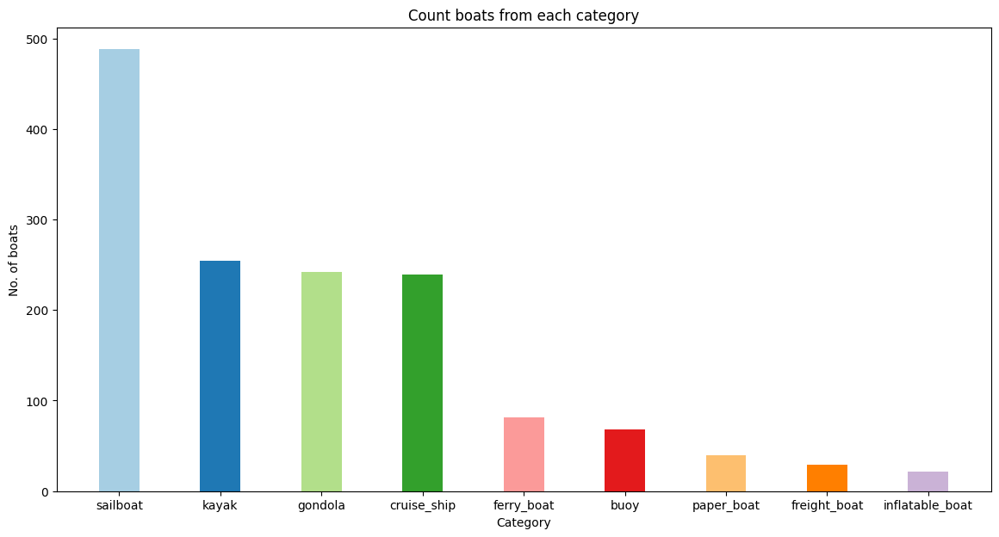

In [ ]:
df_boat_agg = df_boat.groupby("category").agg({"filepath":"count"}).sort_values("filepath",ascending=False).reset_index()

plt.get_cmap
# Figure Size
fig = plt.figure(figsize =(14, 7))
col_map = plt.get_cmap('Paired')
# creating the bar plot
plt.bar(df_boat_agg["category"], df_boat_agg["filepath"], color = col_map.colors,
        width = 0.4)
 
plt.xlabel("Category")
plt.ylabel("No. of boats")
plt.title("Count boats from each category")
plt.show()

There are some categories that don't have many samples, such as freight and inflatable boat. These categories are going to be dismmissed, because they are not  representative of the population being modeled, leading to biased predictions. So,  we are going to keep only the first five main categories.

As an alternative experiment. we tried to train a model using the whole set, but we haven't had a good performance on those categorias with only a few samples.

In [ ]:
width = []
height = []
for path in tqdm(df_boat["filepath"]):
    im = Image.open(path)
    im = np.asarray(im) # convert to numpy array to get dim because jpge images don't have size attribute 
    
    height.append(im.shape[0])
    width.append(im.shape[1])

df_boat["height"] = height
df_boat["width"] = width

  0%|          | 0/1462 [00:00<?, ?it/s]

In the histogram below, we can also look the size distribution. Most images have a width that goes from 1200 px to 1400 px, but they have a high variance regarding to Height, that goes from around 500 px to 1400 px.

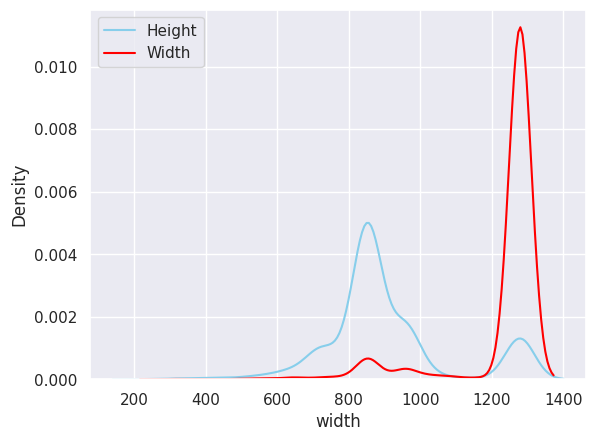

In [ ]:
# set a grey background (use sns.set_theme() if seaborn version 0.11.0 or above) 
sns.set(style="darkgrid")

sns.distplot(df_boat["height"], color="skyblue", label="Height", hist=False, kde=True)
sns.distplot(df_boat["width"], color="red", label="Width", hist=False, kde=True)

plt.legend() 
plt.show()


Imagenet models need an input size of 224 x 224 so one of the preprocessing steps will be to resize the images. Preprocessing is also where we will implement data augmentation for our training data.

Let's check some images from the dataset 

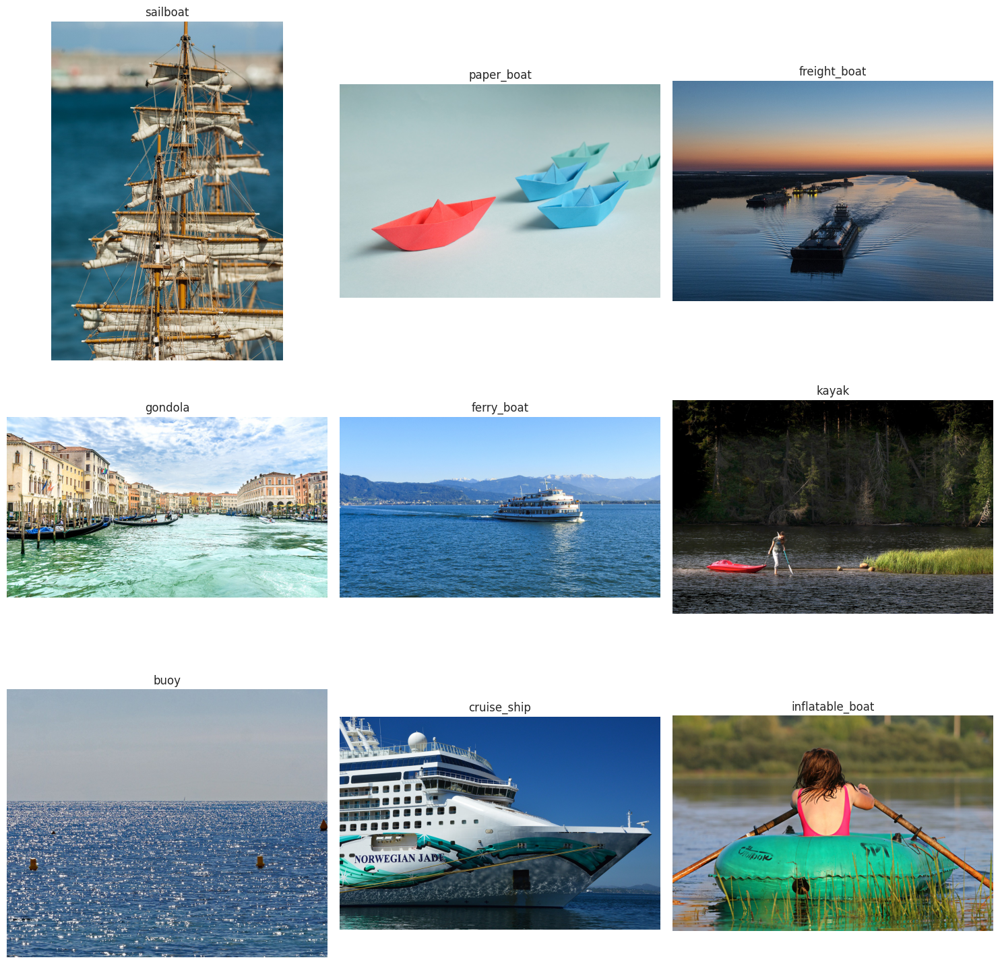

In [ ]:
fig = plt.figure(figsize=(15, 15))
rows, columns = 3, 3
for cnc, cat in enumerate(df_boat.category.unique()):

    filepath = df_boat[df_boat["category"]==cat]["filepath"].sample(n=2).values[0]
    im = Image.open(filepath)

    fig.add_subplot(rows, columns, cnc+1)
    # showing image
    plt.imshow(im)

    # showing image
    plt.axis('off')
    plt.title(cat)

plt.tight_layout()

In [ ]:
# Filtering classes. From here, we are going to work only with the main classes 
boat_filter = df_boat.groupby("category").agg({"filepath":  "count"}).sort_values("filepath", ascending=False)[:5].index.tolist() 
df_boat = df_boat[df_boat["category"].isin(boat_filter)]

# 5.0 split dataset into train/val/test

In order to train our deep learning models, we need to create the required directory structure for our images. Right now, our data directory structure looks like this:

In [21]:
! tree -d {PATH}

data/boats
├── buoy
├── cruise_ship
├── ferry_boat
├── freight_boat
├── gondola
├── inflatable_boat
├── kayak
├── paper_boat
└── sailboat

9 directories


We need our images to be contained in 3 folders train, val and test. We will then train on the images in train dataset, validate on the ones in the val dataset and finally test them on images in the test dataset. Lets do this by splitting a dataset on train/val/test using the function `train_test_split`and then we will create 3 folders for each subset where they will be filled with their own correspondent images.

In [22]:
X_train, X_test, _, _ = train_test_split(
        df_boat, df_boat['category'],stratify=df_boat['category'], test_size=0.4, random_state=38)

X_test, X_val, _, _ = train_test_split(
        X_test, X_test['category'], stratify=X_test['category'], test_size=0.5, random_state=38)

X_train["type"] = "train"
X_test["type"] = "test"
X_val["type"] = "val"

df_boat = pd.concat([X_train, X_test, X_val])

In [23]:
if os.path.exists(f"{os.path.join(PATH.split('/')[0], 'train')}"):
    shutil.rmtree(f"{os.path.join(PATH.split('/')[0], 'train')}")

if os.path.exists(f"{os.path.join(PATH.split('/')[0], 'test')}"):
    shutil.rmtree(f"{os.path.join(PATH.split('/')[0], 'test')}")

if os.path.exists(f"{os.path.join(PATH.split('/')[0], 'val')}"):
    shutil.rmtree(f"{os.path.join(PATH.split('/')[0], 'val')}")

os.mkdir(f"{os.path.join(PATH.split('/')[0], 'train')}")
os.mkdir(f"{os.path.join(PATH.split('/')[0], 'test')}")
os.mkdir(f"{os.path.join(PATH.split('/')[0], 'val')}")

for cat in df_boat.category.unique():
    os.makedirs(f"{os.path.join(PATH.split('/')[0], 'train', cat)}", exist_ok=True)
    os.makedirs(f"{os.path.join(PATH.split('/')[0], 'test', cat)}", exist_ok=True)
    os.makedirs(f"{os.path.join(PATH.split('/')[0], 'val', cat)}", exist_ok=True)

In [24]:
for i, row in df_boat.iterrows():
    type = row["type"]
    cat = row["category"]
    path = row["filepath"]
    
    os.system(f"cp {path} {os.path.join(PATH.split('/')[0], type, cat, path.split('/')[-1])}")


At the end, you will get something like this:


In [32]:
! tree -d data

data
├── boats
│   ├── buoy
│   ├── cruise_ship
│   ├── ferry_boat
│   ├── freight_boat
│   ├── gondola
│   ├── inflatable_boat
│   ├── kayak
│   ├── paper_boat
│   └── sailboat
├── test
│   ├── buoy
│   ├── cruise_ship
│   ├── ferry_boat
│   ├── freight_boat
│   ├── gondola
│   ├── inflatable_boat
│   ├── kayak
│   ├── paper_boat
│   └── sailboat
├── train
│   ├── buoy
│   ├── cruise_ship
│   ├── ferry_boat
│   ├── freight_boat
│   ├── gondola
│   ├── inflatable_boat
│   ├── kayak
│   ├── paper_boat
│   └── sailboat
└── val
    ├── buoy
    ├── cruise_ship
    ├── ferry_boat
    ├── freight_boat
    ├── gondola
    ├── inflatable_boat
    ├── kayak
    ├── paper_boat
    └── sailboat

40 directories


# 6.0 Preprocessing

## 6.1 Transform

In order to use our images with a network trained on the Imagenet dataset, we need to preprocess our images in the same way as the Imagenet network. Subsequently to do that, we need to rescale the images to 224×224 and normalize them. Using `torchvision transforms library` then we can to do it. 

## 6.2 Data Augmentation

The idea of data augmentation is to artificially increase the number of training images that our model sees by applying random transformations to the images. For example, we can randomly rotate or crop the images or flip them horizontally. We want our model to distinguish the objects regardless of orientation and data augmentation and can also make a model invariant to transformations of the input data.

Both operations are done sequentially. We have defined a dict to store each transformation functions subset.

In [ ]:
# Image transformations
image_transforms = {
    # Train uses data augmentation
    'train':
    transforms.Compose([
        transforms.RandomResizedCrop(size=256, scale=(0.8, 1.0)),
        transforms.RandomRotation(degrees=15),
        transforms.ColorJitter(),
        transforms.RandomHorizontalFlip(),
        transforms.CenterCrop(size=224),  # Image net standards
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])  # Imagenet standards
    ]),
    
    # Validation does not use augmentation
    'val':
    transforms.Compose([
        transforms.Resize(size=256),
        transforms.CenterCrop(size=224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], 
                             [0.229, 0.224, 0.225])
    ]),

    # Validation does not use augmentation
    'test':
    transforms.Compose([
        transforms.Resize(size=256),
        transforms.CenterCrop(size=224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], 
                             [0.229, 0.224, 0.225])
    ])
}

Here is an example of the train transforms applied to an image in the training dataset. Not only do we get a lot of different images from a single image, but it also helps our network become invariant to the object orientation.

In [ ]:
def imshow_tensor(tensor):
    # define a transform to convert a tensor to PIL image
    transform = transforms.ToPILImage()

    # convert the tensor to PIL image using above transform and display the PIL image
    plt.imshow(transform(tensor))


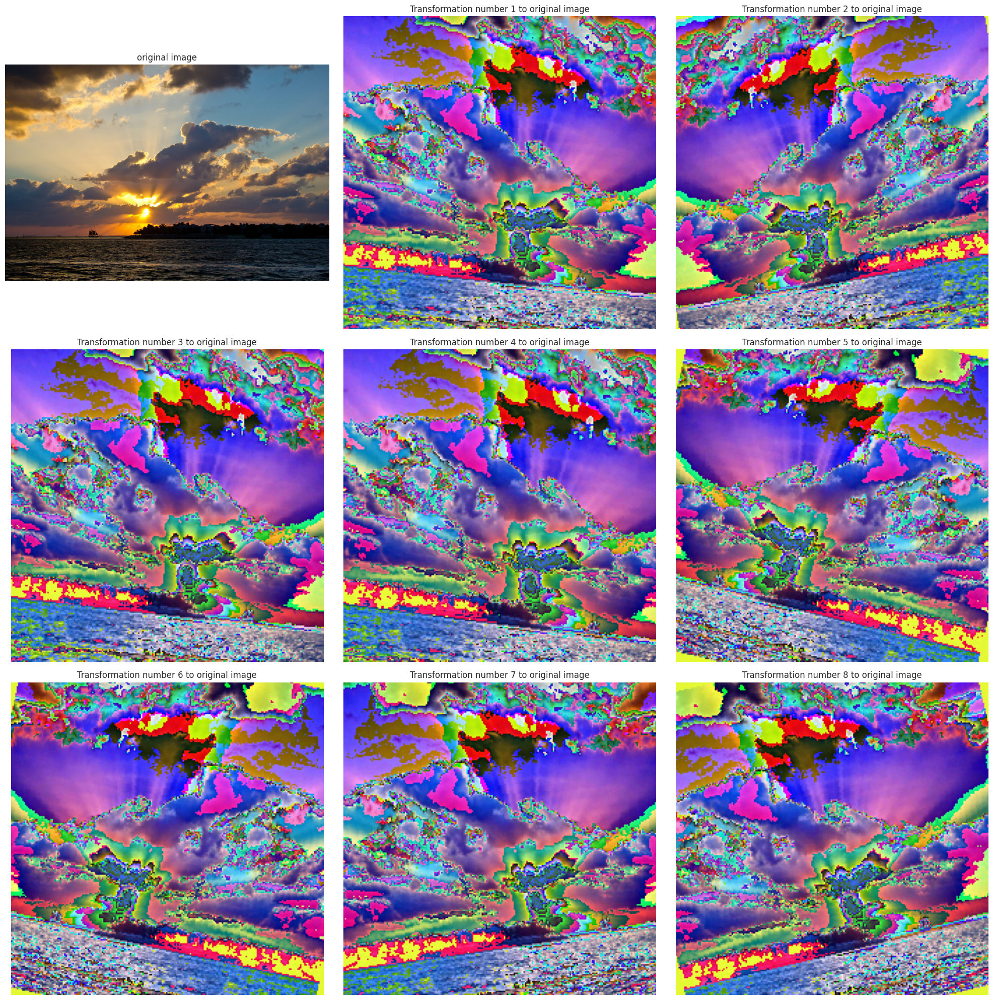

In [ ]:
cat = "sailboat"
filepath = df_boat[df_boat["category"]==cat]["filepath"].sample(n=2).values[0]
im = Image.open(filepath)
t = image_transforms['train']

fig = plt.figure(figsize=(20, 20))
rows, columns = 3, 3

for cnc in range(9):
    fig.add_subplot(rows, columns, cnc+1)

    if cnc == 0: 
        plt.imshow(im)
        # showing image
        plt.axis('off')    
        plt.title("original image")
    else:
        im_transformed = t(im)
        imshow_tensor(im_transformed)
        # showing image
        plt.axis('off')    
        plt.title(f"Transformation number {cnc} to original image")


plt.tight_layout()

# 7.0 DataLoaders

The next step is to provide the training, validation, and test dataset locations to PyTorch. We can do this by using the PyTorch datasets and DataLoader class. This part of the code will mostly remain the same if we have our data in the required directory structures. These dataloaders help us to iterate through the dataset.



In [ ]:
train_dataset = datasets.ImageFolder(root=os.path.join(PATH.split('/')[0], 'train'), transform=image_transforms['train'])
val_dataset = datasets.ImageFolder(root=os.path.join(PATH.split('/')[0], 'val'), transform=image_transforms['val'])
test_dataset = datasets.ImageFolder(root=os.path.join(PATH.split('/')[0], 'test'), transform=image_transforms['test'])

image_datasets = {"train": train_dataset, "val": val_dataset, "test": test_dataset}

class_names = image_datasets['train'].classes
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val', 'test']}


In [ ]:
BATCH_SIZE = 128

train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4)
val_dataloader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4)
test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4)

dataloaders = {"train": train_dataloader, "val": val_dataloader, "test": test_dataloader}

# 8.0 Training the model

Now, let’s write a general function to train a model.

In [ ]:
def train_model(model, criterion, optimizer, scheduler, num_epochs=25):
    """Train a PyTorch Model

    Params
    --------
        model (PyTorch model): cnn to train
        criterion (PyTorch loss): objective to minimize
        optimizer (PyTorch optimizier): optimizer to compute gradients of model parameters
        scheduler
        n_epochs (int): maximum number of training epochs

    Returns
    --------
        model (PyTorch model): trained cnn with best weights
        history (DataFrame): history of train and validation loss and accuracy
    """


    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    history = []  # keep track of training and validation loss each epoch


    for epoch in range(num_epochs):
        print(f'Epoch {epoch}/{num_epochs - 1}')
        print('-' * 10)
        
        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
            if phase == 'train':
                scheduler.step()

            # Calculate average losses
            epoch_loss = running_loss / dataset_sizes[phase]

            # Calculate average accuracy
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')
            history.append([epoch_loss, epoch_acc.item(), phase])

            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
    print(f'Best val Acc: {best_acc:4f}')

    # Format history
    history = pd.DataFrame(
        history,
        columns=[
            'epoch_loss', 'epoch_acc',
            'phase'
        ])

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model, history

## 8.1 Check for GPU device
To accelerate operations in the neural network, we move it to the GPU or MPS if available.

In [ ]:
# Whether to train on a gpu
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print('Using {} device'.format(device))


Using cuda device


## 8.2 ResNet
Before we get straight into training our models, let's see a little bit what a ResNet deep learning architecture is. 

A residual network, or `ResNet` for short, is an artificial neural network that helps to build deeper neural network by utilizing skip connections or shortcuts to jump over some layers. You'll see how skipping helps build deeper network layers without falling into the problem of vanishing gradients.
There are different versions of ResNet, including ResNet-18, ResNet-34, ResNet-50, and so on. The numbers denote layers, although the architecture is the same.
To create a residual block, add a shortcut to the main path in the plain neural network, as shown in the figure below.

![](https://miro.medium.com/v2/resize:fit:1370/format:webp/1*WVs9ywVLLKjSUBZ_mnfFrw.png)



## 8.3 Transfer Learning




The main idea here is taking the ConvNet trained, chop off the last layer(s), retrain the models last layer(s) on a different dataset. Intuitively, you’re retraining the model to recognized different higher level features. As a result, training time gets cut down a lot so transfer learning is a helpful tool when you don’t have enough data or if training takes too much resources as in our case.


![](https://miro.medium.com/v2/resize:fit:1276/format:webp/1*ZkPBqU8vx2vAgcLpz9pi5g.jpeg)




## 8.4 Finetuning the ConvNet

The main idea here, is training  every layer but not from a random initialization starting point, but from a pretrained network.  
First of all, we load our pretrained model. As we've mentioned before, we use resnet50, but other models can effectively be used too.



### 8.4.1 Load and setup ResNet

In [ ]:
model_ft = models.resnet50(pretrained=True)
print(model_ft)

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:01<00:00, 69.3MB/s]

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 


We need to replace the linear classification layer output of the model by our custom classifier. As you can see from the printed model structure bellow, there is a final linear layer with 2048 inputs and 1000 outputs that we are going to remove and replace for our customs layer.

In [ ]:
n_classes = df_boat.category.nunique()
n_inputs = model_ft.fc.in_features

model_ft.fc = nn.Sequential(
                      nn.Linear(n_inputs, 256),
                      nn.ReLU(),
                      nn.Dropout(0.4),
                      nn.Linear(256, n_classes),                   
                      nn.LogSoftmax(dim=1))


Above you can see how many parameters are needed to train to fine-tune the ResNet.

In [ ]:
# Find total parameters and trainable parameters
total_params = sum(p.numel() for p in model_ft.parameters())
print(f'{total_params:,} total parameters.')
total_trainable_params = sum(
    p.numel() for p in model_ft.parameters() if p.requires_grad)
print(f'{total_trainable_params:,} training parameters.')

24,033,861 total parameters.
24,033,861 training parameters.


One of the most important things when you are training any model is to chouse the loss-function and the optimizer used. Here, we've used categorical cross-entropy as we have got a multiclass classification problem and the SGD optimizer, which is one of the most commonly used optimizer.

Beside this, we've set up a schedule to make learning rate adaptable to the gradient descent optimization procedure, in order to increase performance and reduce training time.

In [ ]:
model_ft = model_ft.to(device)


criterion = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ft = optim.SGD(model_ft.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = optim.lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)

### 8.4.2 Train and evaluate


Here we pass the parameters to the function train_model we've defined above. 
It should take around 10-15 min on GPU (K4). On CPU though, it takes far more time than that.

In [ ]:
model_ft, log_ft = train_model(model_ft, criterion, optimizer_ft, exp_lr_scheduler,
                       num_epochs=24)

Epoch 0/23
----------
train Loss: 1.6330 Acc: 0.1573
val Loss: 1.5606 Acc: 0.3870

Epoch 1/23
----------
train Loss: 1.5269 Acc: 0.3824
val Loss: 1.4446 Acc: 0.3755

Epoch 2/23
----------
train Loss: 1.4190 Acc: 0.3913
val Loss: 1.3562 Acc: 0.3755

Epoch 3/23
----------
train Loss: 1.3446 Acc: 0.4182
val Loss: 1.2710 Acc: 0.4138

Epoch 4/23
----------
train Loss: 1.2543 Acc: 0.5128
val Loss: 1.1846 Acc: 0.6092

Epoch 5/23
----------
train Loss: 1.1803 Acc: 0.5921
val Loss: 1.0915 Acc: 0.6705

Epoch 6/23
----------
train Loss: 1.0799 Acc: 0.6905
val Loss: 0.9888 Acc: 0.7471

Epoch 7/23
----------
train Loss: 1.0034 Acc: 0.7417
val Loss: 0.9811 Acc: 0.7586

Epoch 8/23
----------
train Loss: 1.0048 Acc: 0.7379
val Loss: 0.9676 Acc: 0.7625

Epoch 9/23
----------
train Loss: 0.9807 Acc: 0.7532
val Loss: 0.9612 Acc: 0.7739

Epoch 10/23
----------
train Loss: 0.9770 Acc: 0.7468
val Loss: 0.9513 Acc: 0.7778

Epoch 11/23
----------
train Loss: 0.9582 Acc: 0.7685
val Loss: 0.9402 Acc: 0.7893

Ep

### 8.4.3 Training log



From the training log we can see the validation accuracy started at ~38% in the first epoch, and we ended up with a validation accuracy of ~80%. Which is not bad at all.

And here are the training curves showing the loss and accuracy metrics:

In [ ]:
def plot_loss(history):
  plt.figure(figsize=(8, 6))

  epochs = [e for e in range(0, len(history[history["phase"]=="train"]))] 

  plt.plot(epochs,
          history[history["phase"]=="train"]["epoch_loss"], label="train_loss")
  plt.plot(epochs,
          history[history["phase"]=="val"]["epoch_loss"], label="valid_loss")
  plt.legend()
  plt.xlabel('Epoch')
  plt.ylabel('Average Negative Log Likelihood')
  plt.title('Training and Validation Losses')

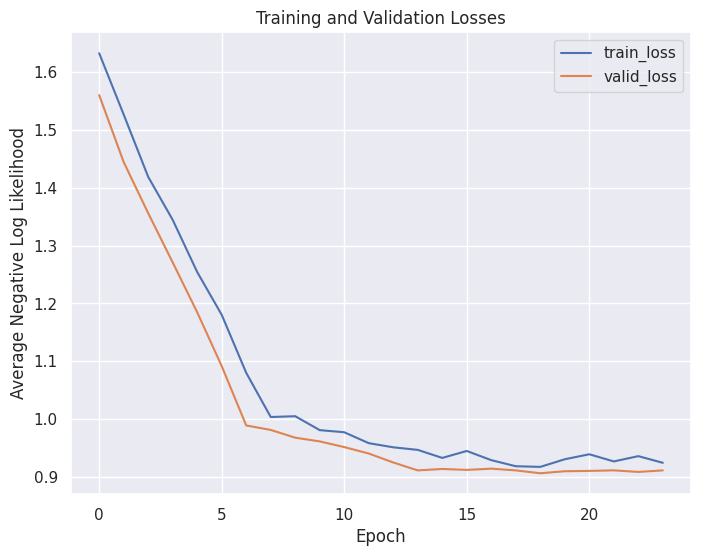

In [ ]:
plot_loss(log_ft)

In [ ]:
def plot_acc(history):

  plt.figure(figsize=(8, 6))

  epochs = [e for e in range(0, len(history[history["phase"]=="train"]))] 

  plt.plot(epochs,
          history[history["phase"]=="train"]["epoch_acc"], label="train_acc")
  plt.plot(epochs,
          history[history["phase"]=="val"]["epoch_acc"], label="valid_acc")
  plt.legend()
  plt.xlabel('Epoch')
  plt.ylabel('Average Accuracy')
  plt.title('Training and Validation Accuracy')

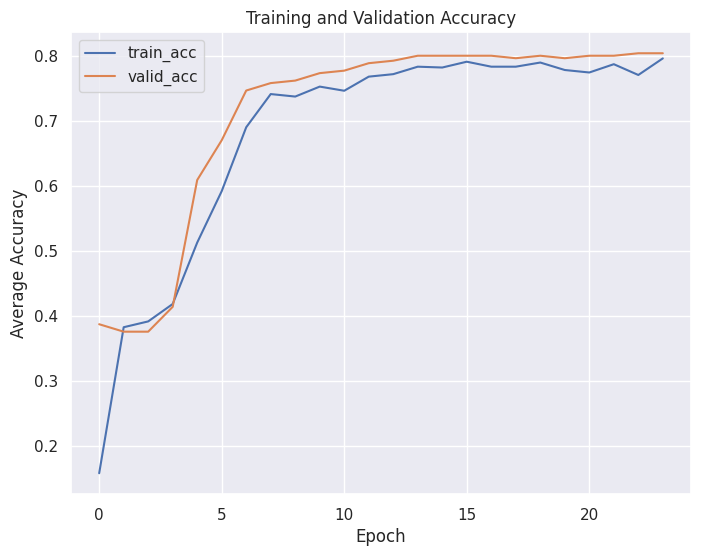

In [ ]:
plot_acc(log_ft)

You can see that from epoch 4 validation accuracy has became higher than train accuracy, meaning that we are not overfitting our model.

### 8.4.4 Save model

In [ ]:
torch.save(model_ft.state_dict(), os.path.join(MODEL_FILE_PATH, 'resnet50_ft_weights.pth'))

## 8.5 ConvNet as fixed feature extractor

Here, it's needed to freeze all the network except the final layer. We have to set requires_grad = False to freeze the parameters so that the gradients are not computed in backward().


### 8.5.1 Load and setup ResNet

In [ ]:
model_conv = models.resnet50(pretrained=True)

for param in model_conv.parameters():
    param.requires_grad = False

model_conv.fc = nn.Sequential(
                      nn.Linear(n_inputs, 256),
                      nn.ReLU(),
                      nn.Dropout(0.4),
                      nn.Linear(256, n_classes),                   
                      nn.LogSoftmax(dim=1))

As a result, we don't need to train all layers, just the last ones we've replaced with random weights. In theory, it should take less time to train it.

In [ ]:
# Find total parameters and trainable parameters
total_params = sum(p.numel() for p in model_conv.parameters())
print(f'{total_params:,} total parameters.')
total_trainable_params = sum(
    p.numel() for p in model_conv.parameters() if p.requires_grad)
print(f'{total_trainable_params:,} training parameters.')

24,033,861 total parameters.
525,829 training parameters.


In [ ]:
model_conv = model_conv.to(device)

criterion = nn.CrossEntropyLoss()

# Observe that only parameters of final layer are being optimized as
# opposed to before.
optimizer_conv = optim.SGD(model_conv.fc.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = optim.lr_scheduler.StepLR(optimizer_conv, step_size=7, gamma=0.1)

### 8.5.2 Train and evaluate


In [ ]:
model_conv, log_conv = train_model(model_conv, criterion, optimizer_conv,
                         exp_lr_scheduler, num_epochs=24)

Epoch 0/23
----------
train Loss: 1.5972 Acc: 0.2954
val Loss: 1.5394 Acc: 0.3870

Epoch 1/23
----------
train Loss: 1.5119 Acc: 0.3760
val Loss: 1.4599 Acc: 0.3755

Epoch 2/23
----------
train Loss: 1.4519 Acc: 0.3760
val Loss: 1.4031 Acc: 0.3755

Epoch 3/23
----------
train Loss: 1.4015 Acc: 0.3811
val Loss: 1.3520 Acc: 0.3755

Epoch 4/23
----------
train Loss: 1.3482 Acc: 0.3939
val Loss: 1.3024 Acc: 0.4176

Epoch 5/23
----------
train Loss: 1.3105 Acc: 0.4361
val Loss: 1.2533 Acc: 0.4828

Epoch 6/23
----------
train Loss: 1.2672 Acc: 0.5013
val Loss: 1.2069 Acc: 0.6207

Epoch 7/23
----------
train Loss: 1.2301 Acc: 0.5742
val Loss: 1.2027 Acc: 0.6284

Epoch 8/23
----------
train Loss: 1.2351 Acc: 0.5767
val Loss: 1.1980 Acc: 0.6284

Epoch 9/23
----------
train Loss: 1.2182 Acc: 0.6023
val Loss: 1.1902 Acc: 0.6245

Epoch 10/23
----------
train Loss: 1.2179 Acc: 0.5870
val Loss: 1.1861 Acc: 0.6398

Epoch 11/23
----------
train Loss: 1.2174 Acc: 0.5997
val Loss: 1.1797 Acc: 0.6513

Ep

### 7.5.3 Training log


From the training log we can see the validation accuracy started at ~29% in the first epoch, and we ended up with a validation accuracy of ~67%. We've got a poor perfomance here. 

Here are the training curves showing the loss and accuracy metrics:

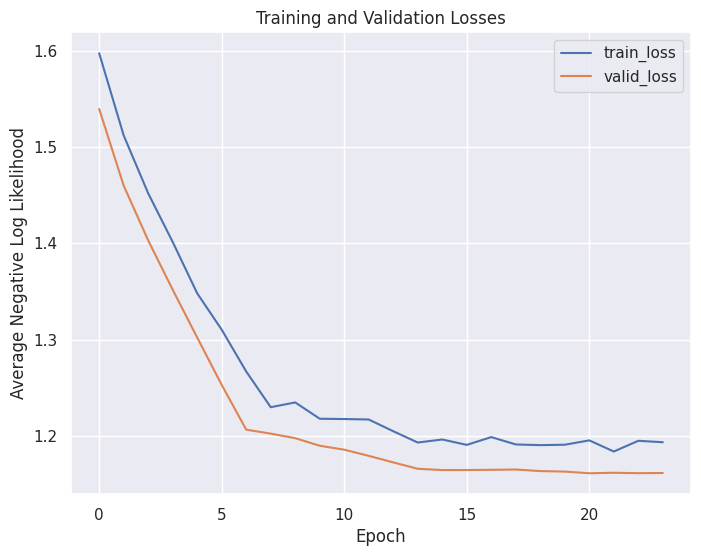

In [ ]:
plot_loss(log_conv)

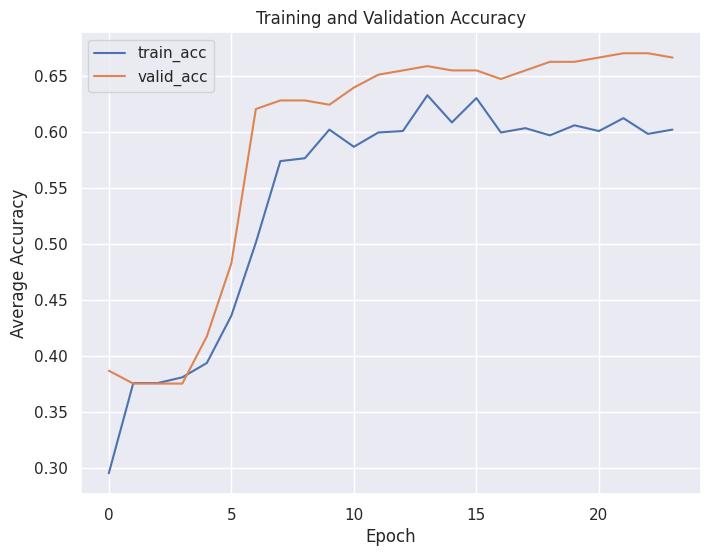

In [ ]:
plot_acc(log_conv)

### 8.5.4 Save model

In [ ]:
torch.save(model_conv.state_dict(), os.path.join(MODEL_FILE_PATH, 'resnet50_conv_weights.pth'))

## 8.6 Inference

Once we have the model, we can do inferences on individual test images or on the whole test dataset to obtain the test accuracy and confusion matrix to finally evaluate how good our model is. We've choosen the first model to evaluate (Finetuning), because it was our winer.

In [ ]:
def predict(model, image_file_path):

    transform = image_transforms['test']
    test_image = Image.open(image_file_path)
    plt.imshow(test_image)
    test_image_tensor = transform(test_image)

    test_image = np.asarray(test_image) # convert to numpy array to get dim because jpge images don't have size attribute 
    
    height = test_image.shape[0]
    width = test_image.shape[1]

    if torch.cuda.is_available():
        test_image_tensor = test_image_tensor.view(1, 3, 224, 224).cuda()
    else:
        test_image_tensor = test_image_tensor.view(1, 3, 224, 224)
    with torch.no_grad():
        model.eval()
        # Model outputs log probabilities
        out = model(test_image_tensor)
        ps = torch.exp(out)
        topk, topclass = ps.topk(1, dim=1)

        
        plt.text((width*0.65) , height*0.07, "Output class: " + class_names[topclass.cpu().numpy()[0][0]], 
                    horizontalalignment='center',
                    verticalalignment='center', 
                    bbox=dict(facecolor='grey', alpha=0.3), size=24, color="White")
        #print("Output class :  ", class_names[topclass.cpu().numpy()[0][0]])
        plt.axis('off') 




In [ ]:
model = models.resnet50() # we do not specify weights, i.e. create untrained model

n_inputs = model.fc.in_features
n_classes = df_boat.category.nunique()

model.fc = nn.Sequential(
                      nn.Linear(n_inputs, 256),
                      nn.ReLU(),
                      nn.Dropout(0.4),
                      nn.Linear(256, n_classes),                   
                      nn.LogSoftmax(dim=1))



model.load_state_dict(torch.load(os.path.join(MODEL_FILE_PATH, 'resnet50_ft_weights.pth'), map_location=torch.device(device)))

model.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

Let's take some random samples from our test dataset and see how our model classify them.

In [ ]:
cat = "kayak"
filepath = df_boat[(df_boat["category"]==cat)]["filepath"].sample(n=2).values[0]
filepath




'data/boats/kayak/paddle-canoeing-kayak-canadians-canadian-812266.jpg'

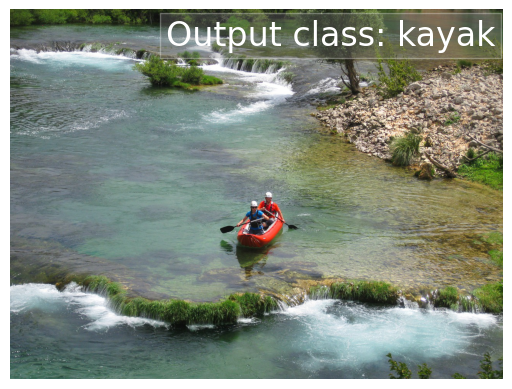

In [ ]:
predict(model,filepath )

=)

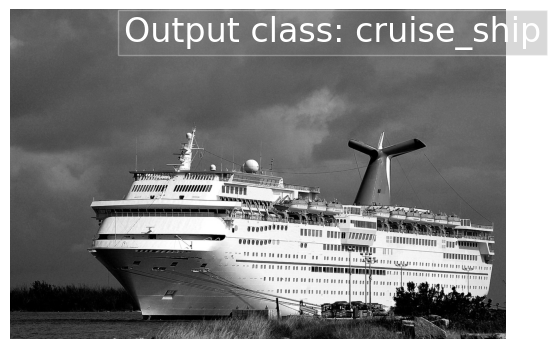

In [ ]:
cat = "cruise_ship"
#filepath = df_boat[(df_boat["category"]==cat) & (df_boat["type"]=="test")]["filepath"].sample(n=2).values[0]
filepath = df_boat[(df_boat["category"]==cat)]["filepath"].sample(n=2).values[0]
predict(model,filepath )



=D

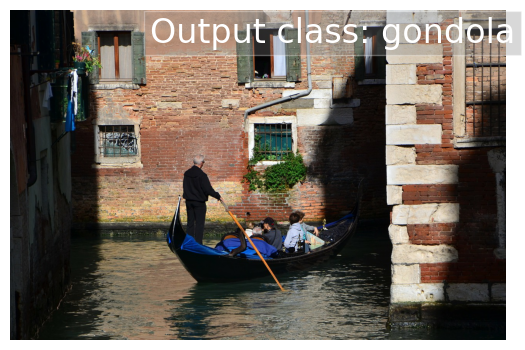

In [ ]:
cat = "gondola"
#filepath = df_boat[(df_boat["category"]==cat) & (df_boat["type"]=="test")]["filepath"].sample(n=2).values[0]
filepath = df_boat[(df_boat["category"]==cat)]["filepath"].sample(n=2).values[0]
predict(model,filepath )



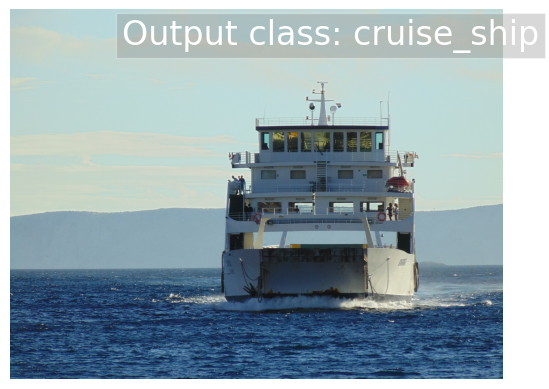

In [ ]:
cat = "ferry_boat"
#filepath = df_boat[(df_boat["category"]==cat) & (df_boat["type"]=="test")]["filepath"].sample(n=2).values[0]
filepath = df_boat[(df_boat["category"]==cat)]["filepath"].sample(n=2).values[0]
predict(model,filepath )



=/

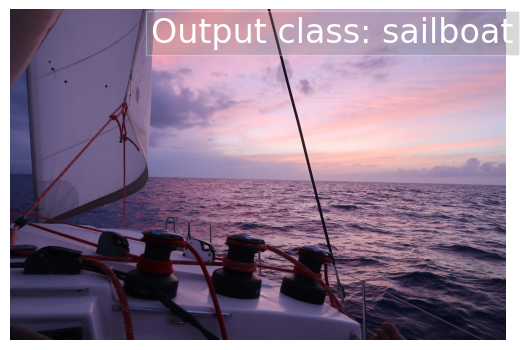

In [ ]:
cat = "sailboat"
#filepath = df_boat[(df_boat["category"]==cat) & (df_boat["type"]=="test")]["filepath"].sample(n=2).values[0]
filepath = df_boat[(df_boat["category"]==cat)]["filepath"].sample(n=2).values[0]
predict(model,filepath )



In [ ]:
def plot_confusion_matrix(model, dataloader, normalize=False):

        y_pred = []
        y_true = []

        class_names = list(dataloader.dataset.class_to_idx.keys())


        # iterate over test data
        for inputs, labels in dataloader:

                inputs = inputs.to(device)
                labels = labels.to(device)
                
                output = model(inputs) # Feed Network

                output = (torch.max(torch.exp(output), 1)[1]).data.cpu().numpy()
                y_pred.extend(output) # Save Prediction
                
                labels = labels.data.cpu().numpy()
                y_true.extend(labels) # Save Truth



        # Build confusion matrix
        cf_matrix = confusion_matrix(y_true, y_pred)

        acc_val = np.round(np.sum(np.asarray(y_pred) == np.asarray(y_true))/len(y_true), 2)

        if normalize:
                df_cm = pd.DataFrame(cf_matrix / np.sum(cf_matrix, axis=1)[:, None], index = [i for i in class_names],
                     columns = [i for i in class_names])
        else:
                df_cm = pd.DataFrame(cf_matrix, index = [i for i in class_names],
                                columns = [i for i in class_names])
                
        plt.figure(figsize = (12,7))
        sns.heatmap(df_cm, annot=True, linewidth=.3, cmap="Blues")


        #add customized title to heatmap
        if normalize:
                plt.title(f"Confusion matrix, with normalization - Accuracy: {acc_val}", loc='left', size=14)
        else:
                plt.title(f"Confusion matrix, without normalization - Accuracy: {acc_val}", loc='left', size=14)
        
        pass


As you can see from the confusion matrix bellow, We've got a overall accuracy of 84%, that is close to the one we got from our validation. Beside, most classes were well classified by our model, except for the ferry boat. Maybe we need more ferry boats cases and retrain a new model to get a better perfomance.

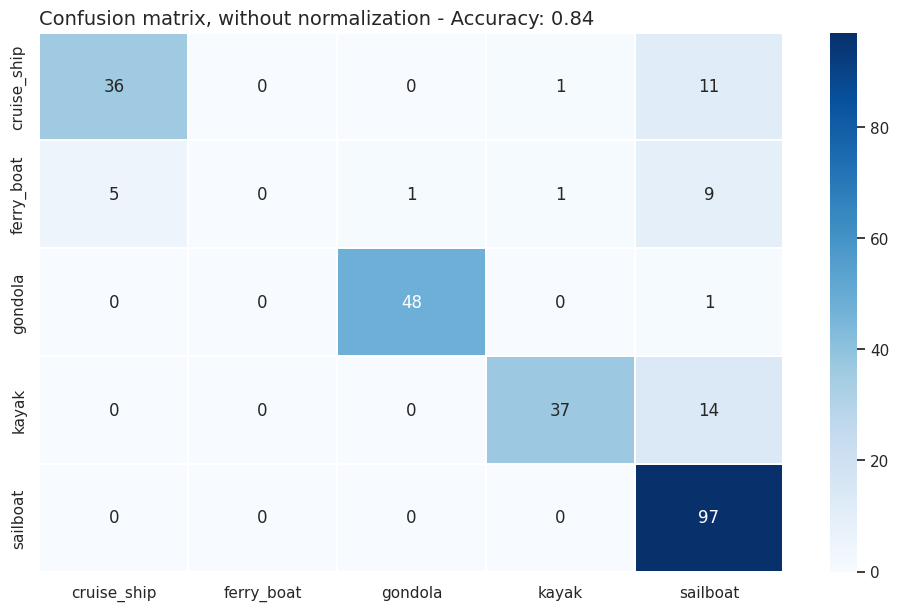

In [ ]:
plot_confusion_matrix(model, test_dataloader)

# 9.0 Conclusion

With this project, we 've gone through some concept of transfer learning, an effective method for object recognition. Instead of training a model from scratch, we can use existing architectures that have been trained on a large dataset and then tune them to our task. This reduces the time to train and often results in better overall performance. 